In [2]:
import pandas as pd
df = pd.read_csv('DAA_blrtoMaa.csv')

In [3]:
train_stops = df['Station name (code)'].tolist()
print(train_stops)

['Bangalore Cy Junction (SBC)', 'Bangalore Cant (BNC)', 'Krishnarajapurm (KJM)', 'Whitefield (WFD)', 'Malur (MLO)', 'Bangarapet (BWT)', 'Kuppam (KPN)', 'Jolarpettai (JTJ)', 'Vaniyambadi (VN)', 'Ambur (AB)', 'Gudiyattam (GYM)', 'Katpadi Junction (KPD)', 'Mukundarayapurm (MCN)', 'Walajah Road Junction (WJR)', 'Sholinghur (SHU)', 'Arakkonam (AJJ)', 'Trivellore (TRL)', 'Perambur (PER)', 'Chennai Central (MAS)']


In [4]:
dic = {}
for index,key in enumerate(train_stops):
  dic[key] = index

print(dic)  

{'Bangalore Cy Junction (SBC)': 0, 'Bangalore Cant (BNC)': 1, 'Krishnarajapurm (KJM)': 2, 'Whitefield (WFD)': 3, 'Malur (MLO)': 4, 'Bangarapet (BWT)': 5, 'Kuppam (KPN)': 6, 'Jolarpettai (JTJ)': 7, 'Vaniyambadi (VN)': 8, 'Ambur (AB)': 9, 'Gudiyattam (GYM)': 10, 'Katpadi Junction (KPD)': 11, 'Mukundarayapurm (MCN)': 12, 'Walajah Road Junction (WJR)': 13, 'Sholinghur (SHU)': 14, 'Arakkonam (AJJ)': 15, 'Trivellore (TRL)': 16, 'Perambur (PER)': 17, 'Chennai Central (MAS)': 18}


In [5]:
df = pd.read_csv('DAA_PERSON_DATA_final.csv')
len(df)

1000

In [11]:
import random
import pandas as pd


# Define the seat types
seat_types = ['1AC', '2AC', '3AC', 'SL', '2S']

# Calculate the number of tickets per seat type
tickets_per_type = len(df) // len(seat_types)

# Shuffle the seat types
random.shuffle(seat_types)

# Create a new column 'Seat Type' and assign seat types randomly
df['Seat Type'] = seat_types * tickets_per_type

# If there are any remaining tickets, assign seat types randomly from the remaining list
remaining_tickets = len(df) % len(seat_types)
if remaining_tickets > 0:
    df['Seat Type'] = df['Seat Type'].tolist() + random.sample(seat_types, remaining_tickets)

# Print the updated dataset
df

,Person ID,Source Station,Destination Station,Seat Type
0,1,Bangalore Cy Junction (SBC),Bangalore Cant (BNC),1AC
1,2,Bangalore Cy Junction (SBC),Krishnarajapurm (KJM),3AC
2,3,Bangalore Cy Junction (SBC),Whitefield (WFD),2AC
3,4,Bangalore Cy Junction (SBC),Malur (MLO),2S
4,5,Bangalore Cy Junction (SBC),Bangarapet (BWT),SL
...,...,...,...,...
995,996,Bangarapet (BWT),Sholinghur (SHU),1AC
996,997,Kuppam (KPN),Arakkonam (AJJ),3AC
997,998,Jolarpettai (JTJ),Trivellore (TRL),2AC
998,999,Vaniyambadi (VN),Perambur (PER),2S


In [12]:
df1 = df.sample(frac = 0.1)
df2 = df.sample(frac = 0.2)
df3 = df.sample(frac = 0.3)
df4 = df.sample(frac = 0.4)
df5 = df.sample(frac = 0.5)
df6 = df.sample(frac = 0.6)
df7 = df.sample(frac = 0.7)
df8 = df.sample(frac = 0.8)
df9 = df.sample(frac = 0.9)

df_list = [df1,df2,df3,df4,df5,df6,df7,df8,df9]

In [18]:
interval_list = []

for i, df in enumerate(df_list):
    source_station_list = df['Source Station'].tolist()
    destination_station_list = df['Destination Station'].tolist()

    source_station_number = []
    for station in source_station_list:
        source_station_number.append(dic[station])

    destination_station_number = []
    for station in destination_station_list:
        destination_station_number.append(dic[station])

    intervals = list(zip(source_station_number, destination_station_number))
    interval_list.append(intervals)

    # Optional: Assign intervals to interval_i where i corresponds to dataframe index
    globals()[f'intervals_{i+1}'] = intervals

In [20]:
import matplotlib.pyplot as plt

def plot_train_seats(seat_schedule):
    # Filter out seats with no assigned intervals
    seat_schedule_filtered = [seat for seat in seat_schedule if seat]

    if not seat_schedule_filtered:
        print("No seat assignments available.")
        return

    # Prepare data for plotting
    seat_labels = [i+1 for i in range(len(seat_schedule_filtered))]
    y_ticks = list(range(len(seat_schedule_filtered)))
    y_labels = seat_labels
    x_labels = sorted(list(set([station for seat in seat_schedule_filtered for journey in seat for station in journey])))

    # Sort x_labels in ascending order and convert them to integers
    x_labels = sorted([int(label) for label in x_labels])

    # Create a figure and axes
    fig, ax = plt.subplots(figsize=(90, 40))  # Increase the figure size

    # Set y-axis labels with larger font size and adjust y-axis scaling
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(y_labels, fontsize=15)  # Increase the font size
    ax.set_ylim(-0.5, len(seat_schedule_filtered) - 0.5)

    # Set x-axis labels
    ax.set_xticks(range(len(x_labels)))
    ax.set_xticklabels(x_labels, rotation=45)

    # Calculate the width of each bar
    total_bars = len(seat_schedule_filtered) * len(seat_schedule_filtered[0])
    bar_width = 0.8 / total_bars

    # Plot the seat schedule with wider bars and spacing
    for i, seat in enumerate(seat_schedule_filtered):
        for j, journey in enumerate(seat):
            journey_start = x_labels.index(int(journey[0]))
            journey_end = x_labels.index(int(journey[1]))
            ax.barh(i, journey_end - journey_start, left=journey_start + j * bar_width, height=1.2)  # Increase the height and set the color

    # Set plot title and labels
    ax.set_title('Train Seat Scheduling')
    ax.set_xlabel('Stations')

    # Display the plot
    plt.tight_layout()
    plt.show()


0.005997896194458008



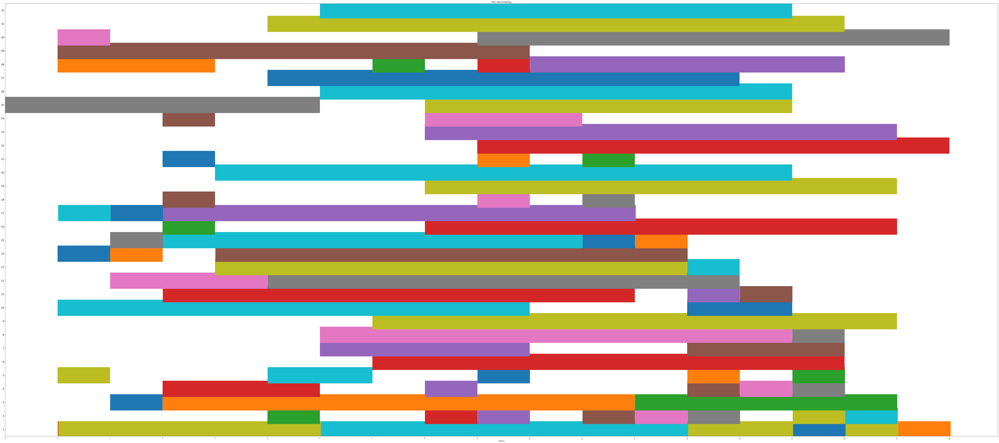

0.018674612045288086



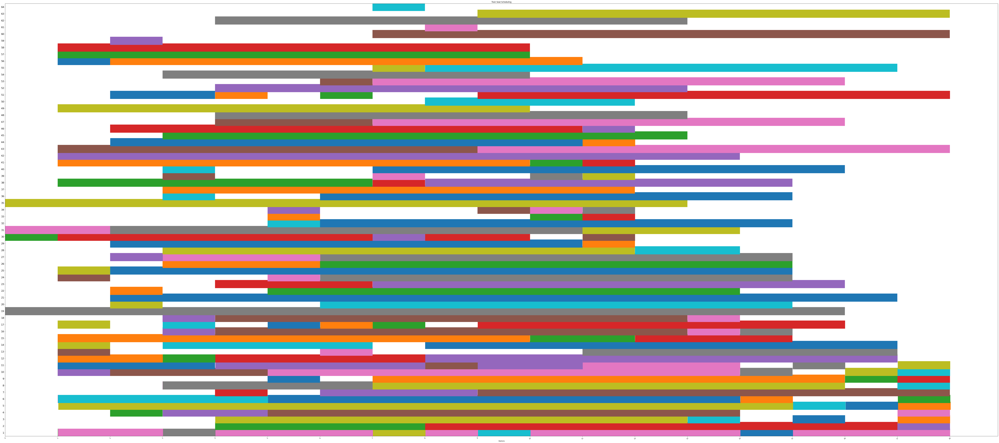

0.07405924797058105



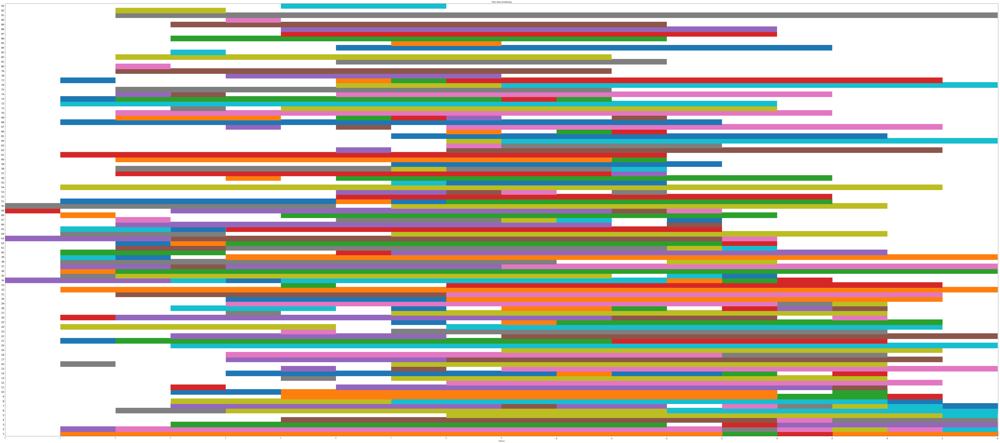

0.20809507369995117



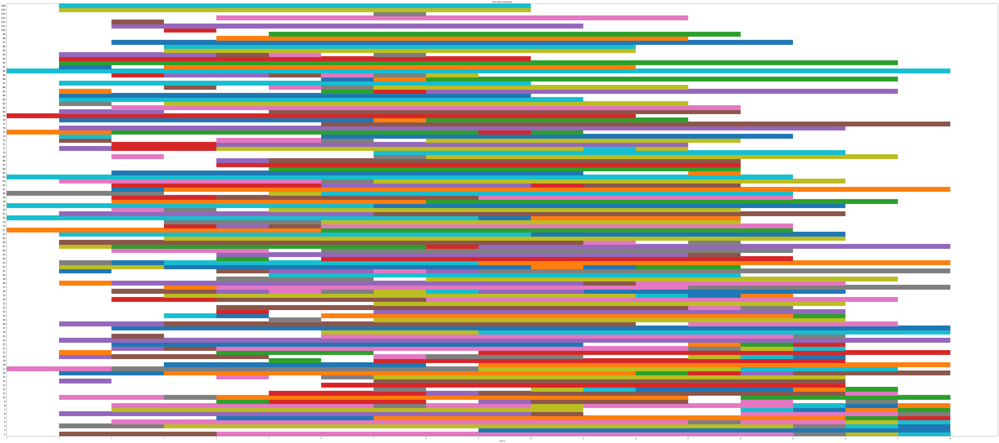

0.3602166175842285



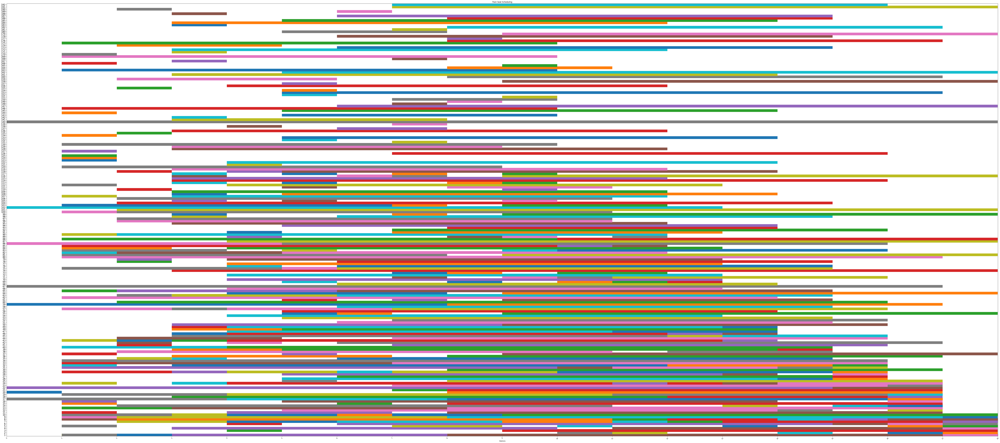

0.20579743385314941



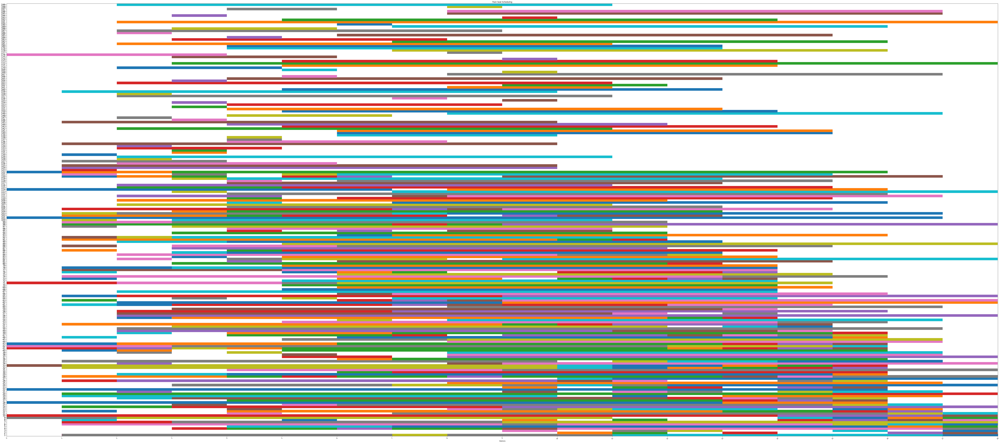

0.2534959316253662



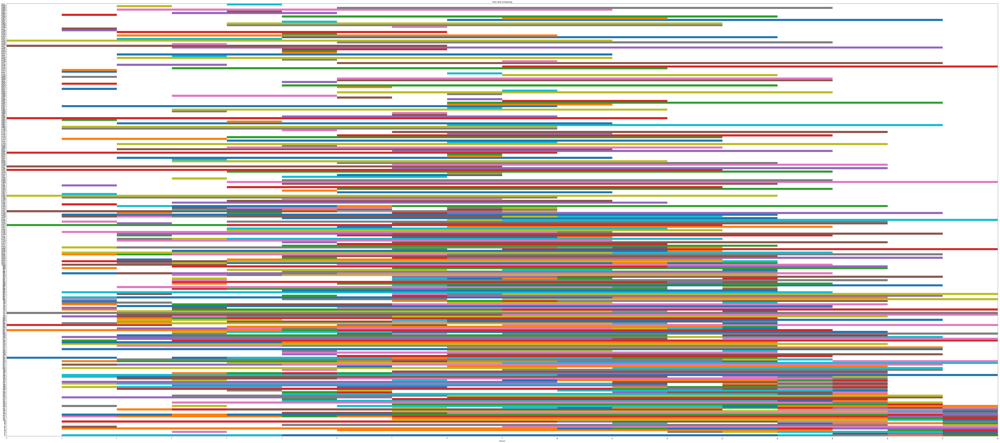

0.32613158226013184



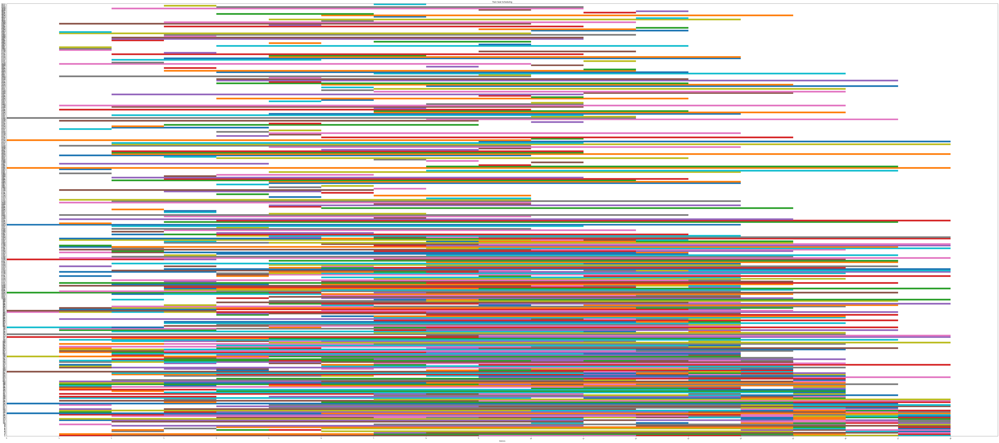

0.383803129196167



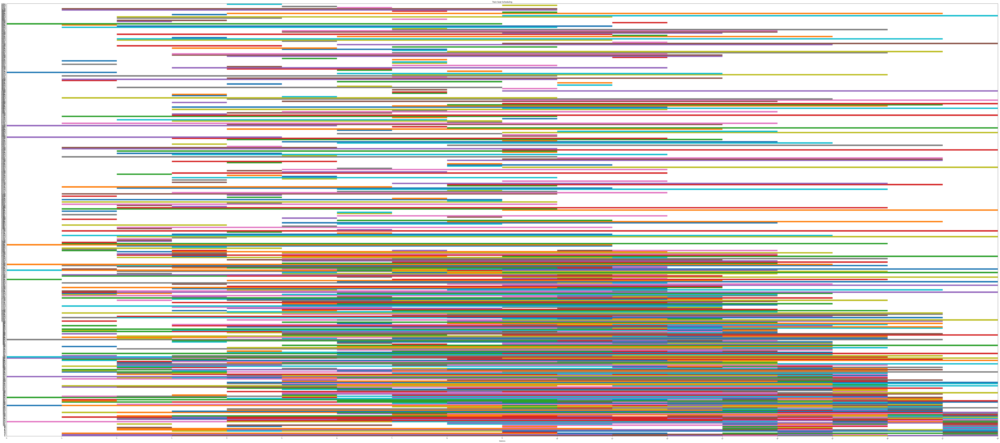

In [29]:
from collections import defaultdict
import time

def assign_tickets_to_seats(intervals):
    start_time = time.time()

    def build_residual_graph(intervals):
        graph = defaultdict(dict)

        for interval in intervals:
            source = f"S-{interval}"
            sink = f"T-{interval}"
            capacity = 1

            graph[source][sink] = capacity
            graph[sink][source] = 0

        for i in range(len(intervals)):
            for j in range(i + 1, len(intervals)):
                interval_a = intervals[i]
                interval_b = intervals[j]

                if interval_a[1] <= interval_b[0]:
                    source = f"T-{interval_a}"
                    sink = f"S-{interval_b}"
                    capacity = 1

                    graph[source][sink] = capacity
                    graph[sink][source] = 0

        return graph

    # Use depth-first search to find an augmenting path
    def dfs(graph, source, sink, visited, path):
        visited.add(source)
        path.append(source)

        if source == sink:
            return path

        for neighbor, capacity in graph[source].items():
            if capacity > 0 and neighbor not in visited:
                result = dfs(graph, neighbor, sink, visited, path)
                if result is not None:
                    return result

        path.pop()
        return None

    # Use the Ford-Fulkerson algorithm to find the maximum flow
    def ford_fulkerson(graph, source, sink):
        max_flow = 0

        while True:
            visited = set()
            path = dfs(graph, source, sink, visited, [])

            if path is None:
                break

            # Find the minimum residual capacity along the augmenting path
            min_capacity = float("inf")
            for i in range(len(path) - 1):
                u = path[i]
                v = path[i + 1]
                min_capacity = min(min_capacity, graph[u][v])

            # Update the residual capacities of the edges and reverse edges
            for i in range(len(path) - 1):
                u = path[i]
                v = path[i + 1]
                graph[u][v] -= min_capacity
                graph[v][u] += min_capacity

            max_flow += min_capacity

        return max_flow

    # Convert seat assignments to the desired format
    def convert_to_formatted_assignments(intervals, flow):
        seat_assignments = [[] for _ in range(flow)]

        for interval in intervals:
            assigned = False

            for i in range(flow):
                seat = seat_assignments[i]
                if not seat or interval[0] >= seat[-1][1]:
                    # No overlap, assign the interval to this seat
                    seat.append(interval)
                    assigned = True
                    break

            if not assigned:
                # No available seat found without overlap, assign the interval to a new seat
                seat_assignments.append([interval])

        seat_assignments_formatted = [[(str(interval[0]), str(interval[1])) for interval in seat if interval[0] != interval[1]]
                                      for seat in seat_assignments]

        return seat_assignments_formatted

    # Build the residual graph
    graph = build_residual_graph(intervals)

    # Set the source and sink nodes
    source = "Source"
    sink = "Sink"

    # Add edges from source to intervals
    for interval in intervals:
        node = f"S-{interval}"
        capacity = 1
        graph[source][node] = capacity
        graph[node][source] = 0

    # Add edges from intervals to sink
    for interval in intervals:
        node = f"T-{interval}"
        capacity = 1
        graph[node][sink] = capacity
        graph[sink][node] = 0

    # Use the Ford-Fulkerson algorithm to find the maximum flow
    max_flow = ford_fulkerson(graph, source, sink)

    # Convert the seat assignments to the desired format
    seat_assignments = convert_to_formatted_assignments(intervals, max_flow)
    end_time = time.time()
    print(end_time - start_time)
    return seat_assignments


for i, df in enumerate(df_list):
    intervals = globals()[f'intervals_{i+1}']  # Assumes intervals_i variables are already defined

    seat_assignments = assign_tickets_to_seats(intervals)
    seat_labels = [str(i+1) for i in range(len(seat_assignments))]
    for i, seat_label in enumerate(seat_labels):
        seat_intervals = seat_assignments[i]
        if seat_intervals:
            intervals_str = ", ".join(f"({start}, {end})" for start, end in seat_intervals)
            # print(f"Seat {seat_label}: {intervals_str}")
    print()

    # Commented out plot_train_seats
    plot_train_seats(seat_assignments)


0.0004432201385498047



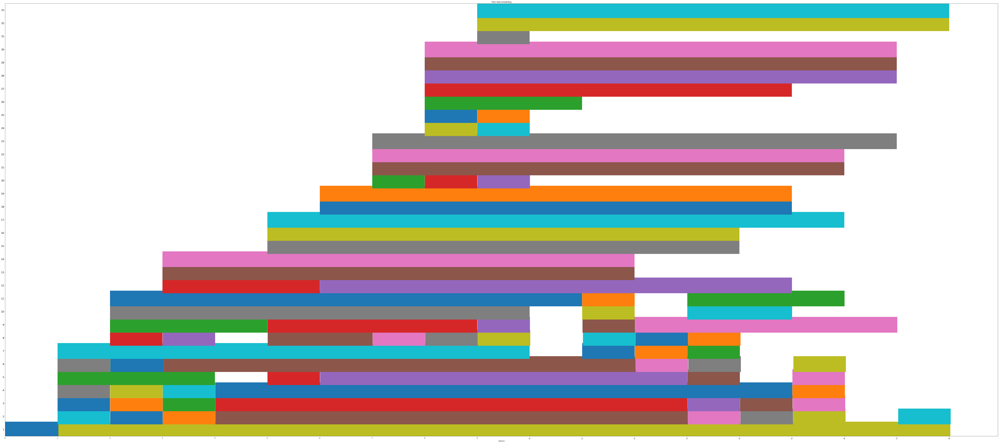

0.0006723403930664062



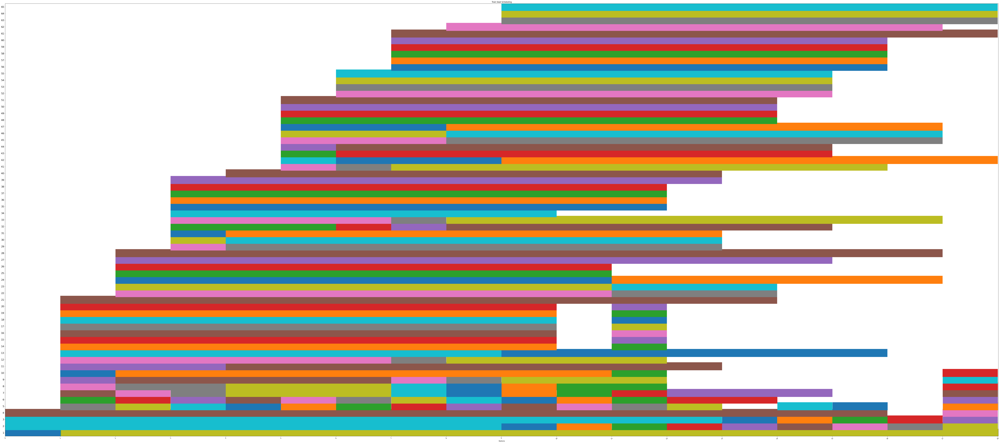

0.0010771751403808594



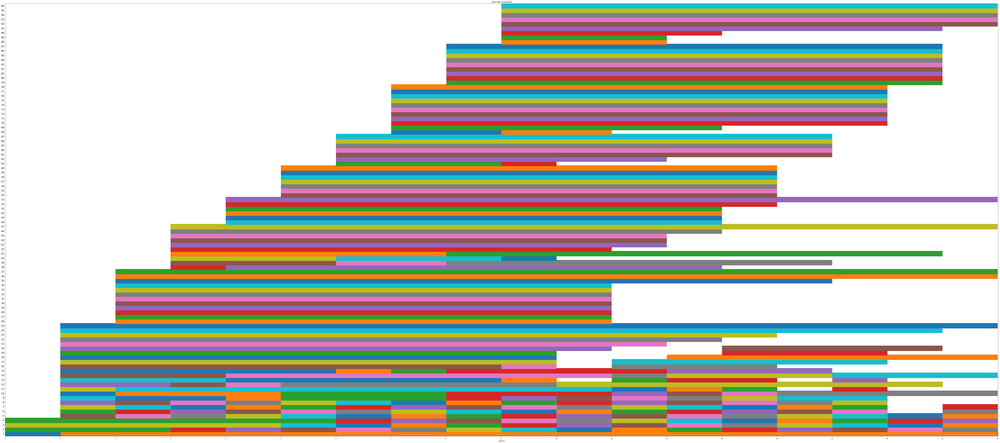

0.0015950202941894531



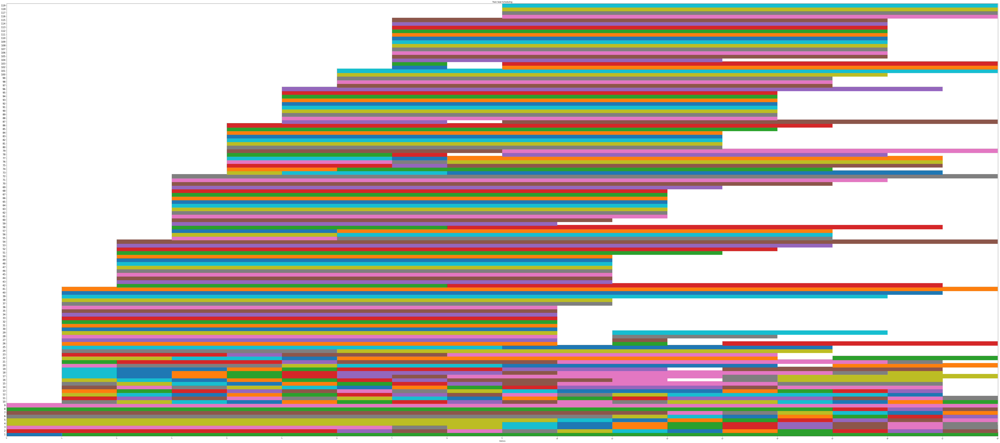

0.0026862621307373047



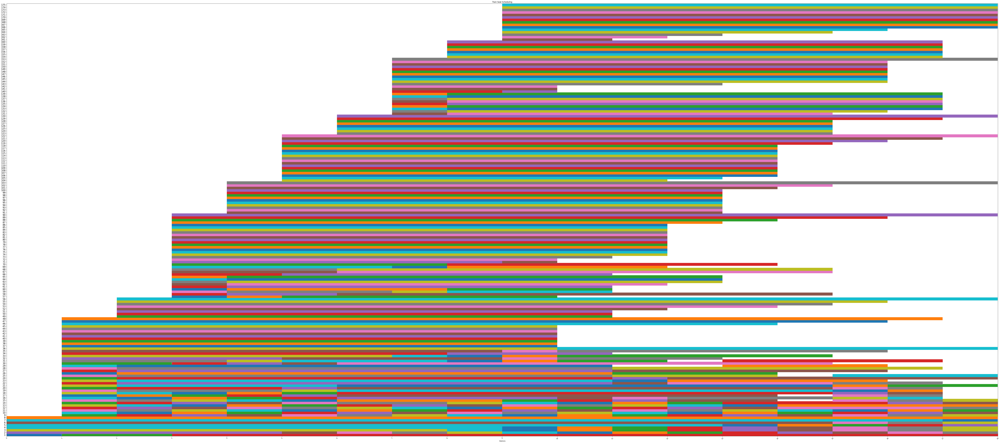

0.0031697750091552734



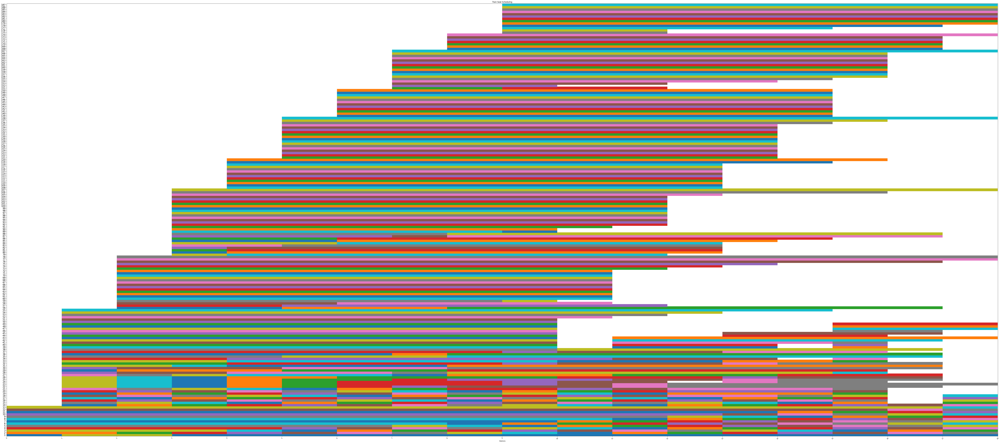

0.012895345687866211



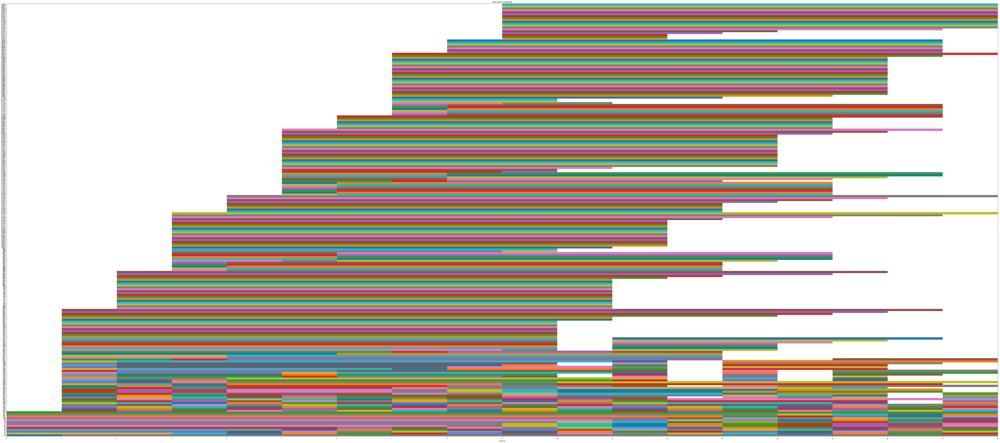

0.006776571273803711



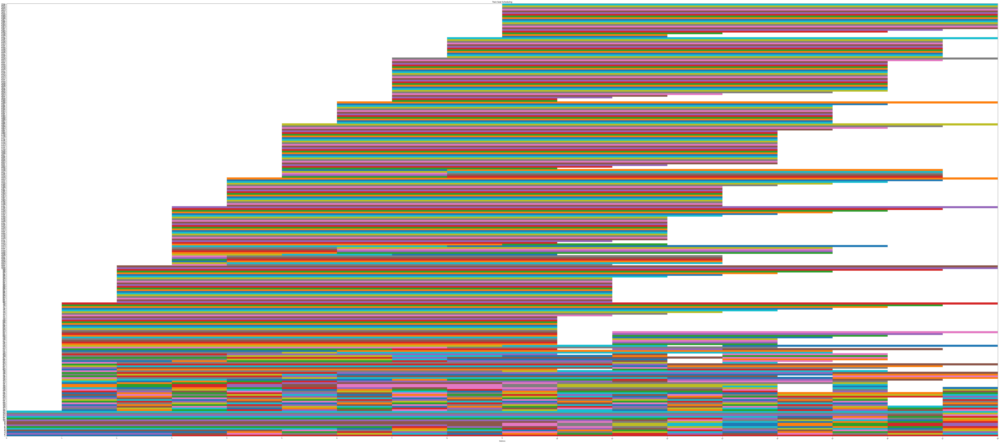

0.008980274200439453



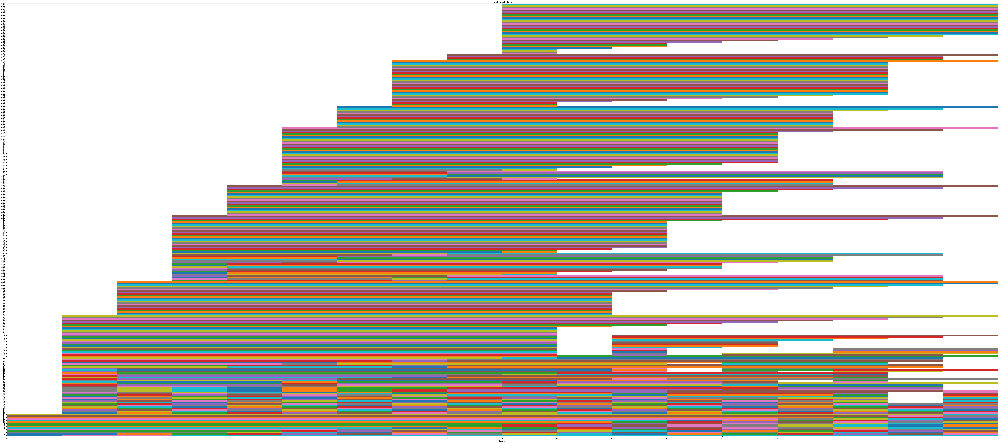

In [30]:
import time

def assign_tickets_to_seats_GREEDY(intervals):
    start_time = time.time()
    sorted_intervals = sorted(intervals, key=lambda x: (x[0], x[1] - x[0]))

    seat_assignments = {}

    for interval in sorted_intervals:
        assigned = False

        for seat, assigned_intervals in seat_assignments.items():
            last_interval_end = assigned_intervals[-1][1]

            if interval[0] >= last_interval_end:
                # No overlap, assign the interval to this seat
                seat_assignments[seat].append(interval)
                assigned = True
                break

        if not assigned:
            # No available seat found without overlap, assign the interval to a new seat
            new_seat = chr(ord('A') + len(seat_assignments))
            seat_assignments[new_seat] = [interval]

    # Convert seat assignments to the desired format
    seat_assignments_formatted = [[(str(interval[0]), str(interval[1])) for interval in assigned_intervals]
                                  for assigned_intervals in seat_assignments.values()
                                  if assigned_intervals]  # Exclude empty intervals
    end_time = time.time()
    print(end_time - start_time)
    return seat_assignments_formatted

for i, df in enumerate(df_list):
    intervals = globals()[f'intervals_{i+1}']  # Assumes intervals_i variables are already defined

    seat_assignments = assign_tickets_to_seats_GREEDY(intervals)

    # Commented out print statements and plot_train_seats
    seat_labels = [str(i+1) for i in range(len(seat_assignments))]
    for i, seat_label in enumerate(seat_labels):
        seat_intervals = seat_assignments[i]
        if seat_intervals:
            intervals_str = ", ".join(f"({start}, {end})" for start, end in seat_intervals)
            # print(f"Seat {seat_label}: {intervals_str}")
    # print(f"Interval {i+1} time taken: {end_time - start_time}")
    print()

    # Commented out plot_train_seats
    plot_train_seats(seat_assignments)




0.0003345012664794922



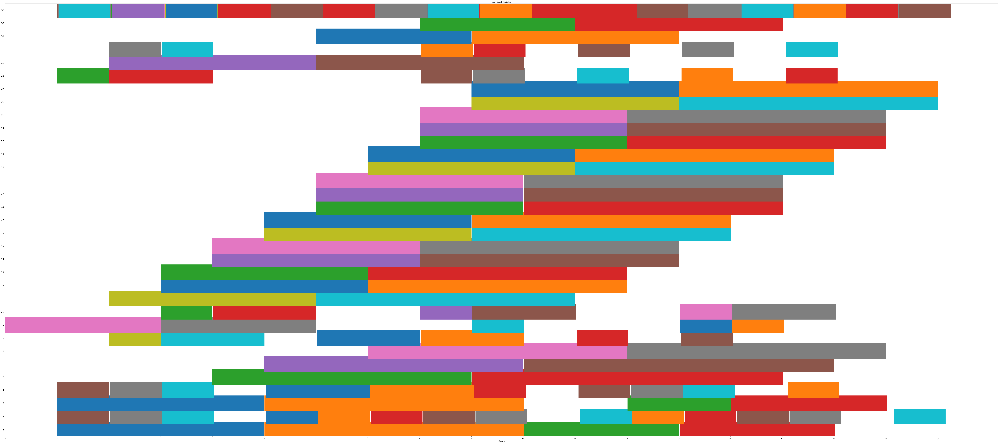

0.0013477802276611328



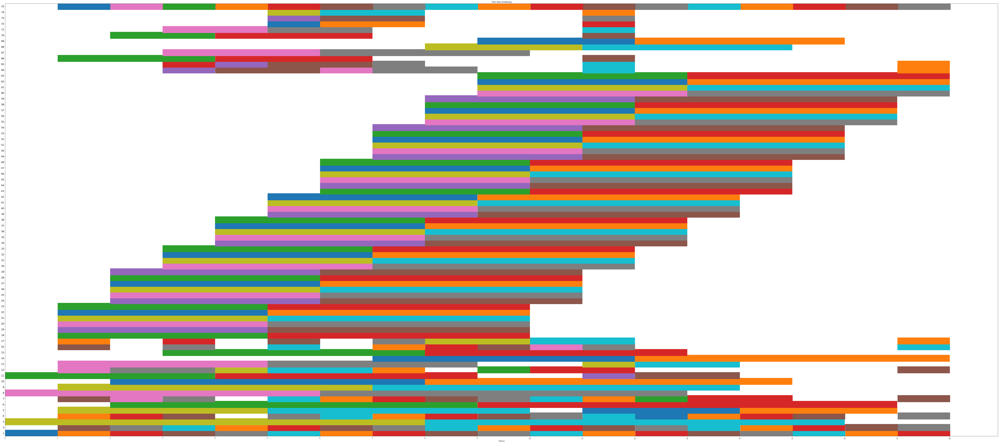

0.001199483871459961



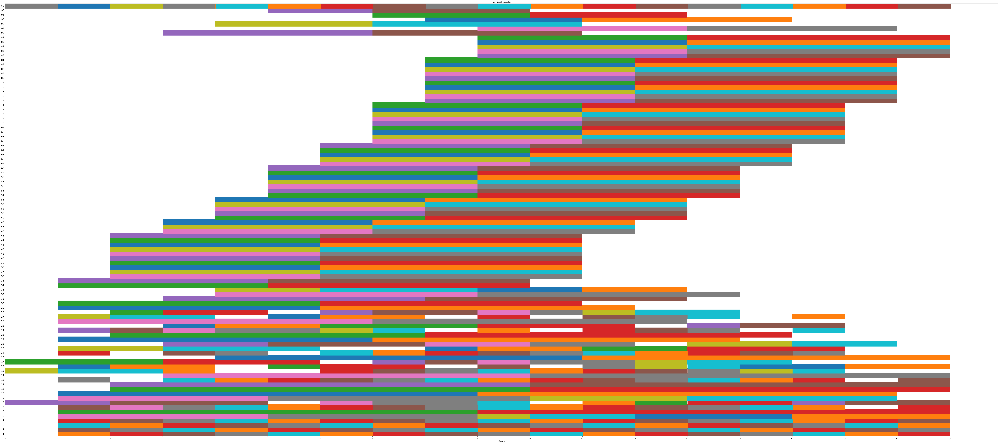

0.0018074512481689453



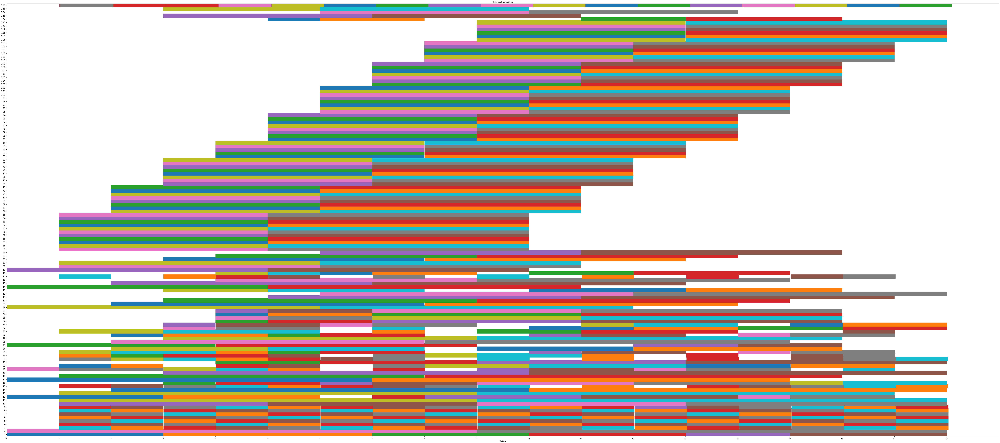

0.0027098655700683594



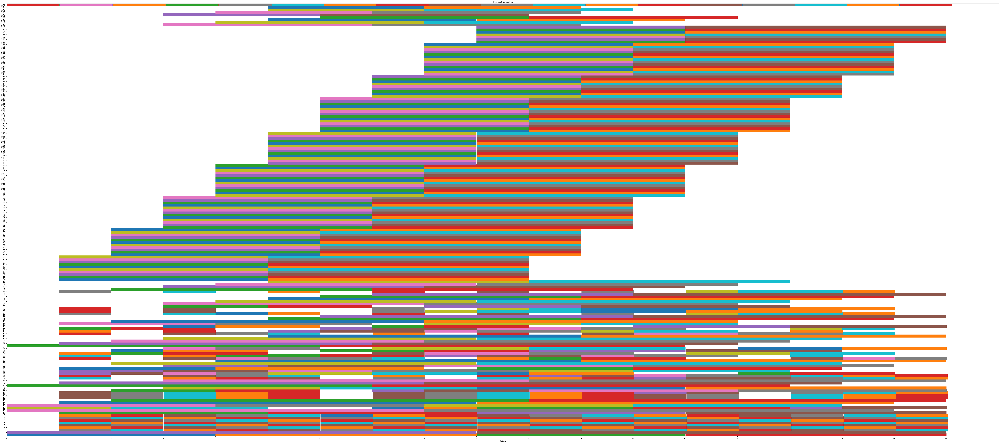

0.006966829299926758



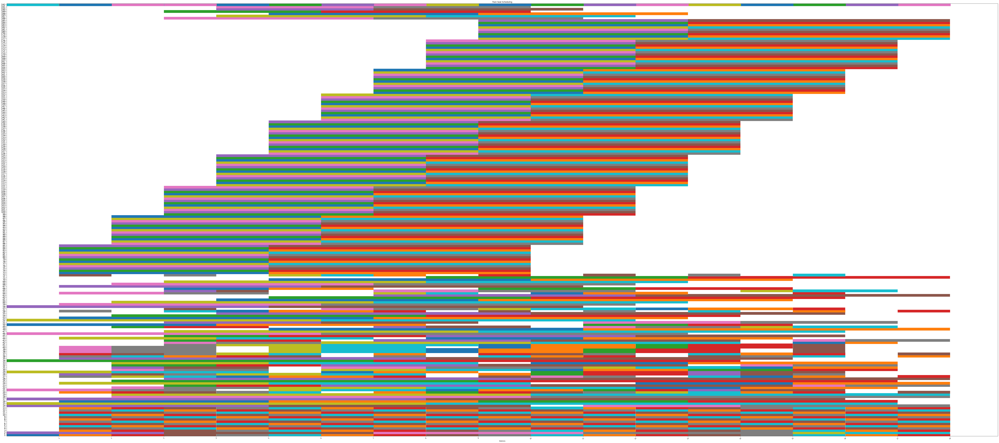

0.004725933074951172



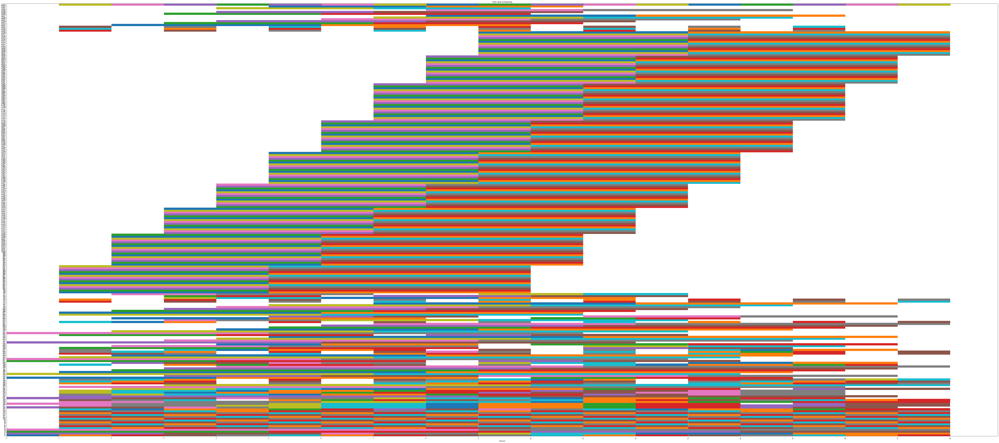

0.009838581085205078



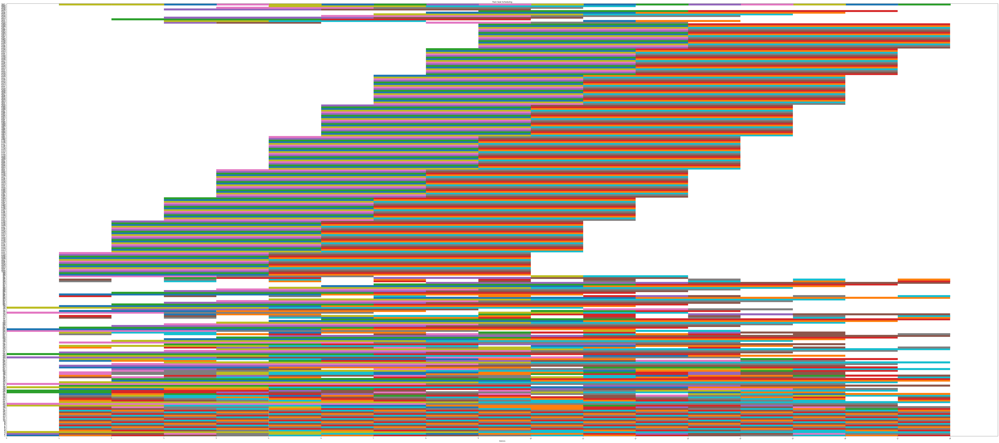

0.014487266540527344



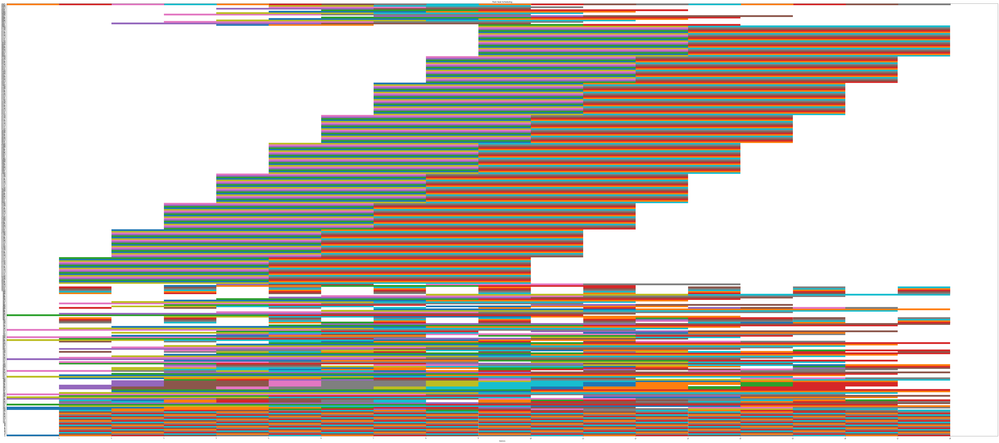

In [32]:
import math

def assign_tickets_to_seats_dp(intervals):
    start_time = time.time()
    sorted_intervals = sorted(intervals, key=lambda x: (x[1], x[0]))

    seat_assignments = [[]]

    for interval in sorted_intervals:
        assigned = False

        for seat in seat_assignments:
            if not seat or interval[0] >= seat[-1][1]:
                # No overlap, assign the interval to this seat
                seat.append(interval)
                assigned = True
                break

        if not assigned:
            # No available seat found without overlap, assign the interval to a new seat
            seat_assignments.append([interval])

    # Optimize seat assignments
    seat_assignments = optimize_seat_assignments(seat_assignments)

    # Convert seat assignments to the desired format
    seat_assignments_formatted = [[(str(interval[0]), str(interval[1])) for interval in seat if interval]
                                  for seat in seat_assignments]
    end_time = time.time()
    print(end_time - start_time)
    return seat_assignments_formatted

def optimize_seat_assignments(seat_assignments):
    seat_assignments = first_fit_decreasing(seat_assignments)
    seat_assignments = greedy_merging(seat_assignments)
    seat_assignments = seat_splitting(seat_assignments)
    #seat_assignments = dynamic_resizing(seat_assignments)
    return seat_assignments

def first_fit_decreasing(seat_assignments):
    sorted_assignments = sorted(seat_assignments, key=lambda seat: sum(interval[1] - interval[0] for interval in seat), reverse=True)
    return sorted_assignments

def greedy_merging(seat_assignments):
    merged_assignments = []
    for seat in seat_assignments:
        if not merged_assignments:
            merged_assignments.append(seat)
        else:
            last_seat = merged_assignments[-1]
            if seat[0][0] >= last_seat[-1][1]:
                last_seat.extend(seat)
            else:
                merged_assignments.append(seat)
    return merged_assignments

def seat_splitting(seat_assignments):
    updated_assignments = []
    for seat in seat_assignments:
        updated_seat = []
        for interval in seat:
            if interval[1] - interval[0] >= 0 :
                mid = (interval[0] + interval[1]) // 2
                updated_seat.append((interval[0], mid))
                updated_seat.append((mid, interval[1]))
            else:
                updated_seat.append(interval)
        updated_assignments.append(updated_seat)
    return updated_assignments

def dynamic_resizing(seat_assignments):
    for seat in seat_assignments:
        start = seat[0][0]
        end = seat[-1][1]
        if end - start > len(seat):
            seat[-1] = (seat[-1][0], seat[-1][0] + len(seat))
    return seat_assignments


for i, df in enumerate(df_list):
    intervals = globals()[f'intervals_{i+1}']  # Assumes intervals_i variables are already defined

    seat_assignments = assign_tickets_to_seats_dp(intervals)

    # Commented out print statements and plot_train_seats
    seat_labels = [str(i) for i in range(len(seat_assignments))]
    for i, seat_label in enumerate(seat_labels):
        intervals_str = ", ".join(f"({start}, {end})" for start, end in seat_assignments[i])
        # print(f"Seat {seat_label}: {intervals_str}")
    # print(f"Interval {i+1} time taken: {end_time - start_time}")
    print()

    # Commented out plot_train_seats
    plot_train_seats(seat_assignments)



In [34]:
import random
import pandas as pd


# Define the seat types and their corresponding fares
seat_types = {
    '1AC': 6000,
    '2AC': 3500,
    '3AC': 2500,
    'SL': 1000,
    '2S': 500
}

# Generate revenue for each ticket
df['Revenue'] = df['Seat Type'].map(seat_types)

# Print the updated dataset with revenue
df

,Person ID,Source Station,Destination Station,Seat Type,Revenue
757,758,Trivellore (TRL),Perambur (PER),2AC,3500
788,789,Kuppam (KPN),Jolarpettai (JTJ),2S,500
465,466,Jolarpettai (JTJ),Vaniyambadi (VN),1AC,6000
940,941,Krishnarajapurm (KJM),Katpadi Junction (KPD),1AC,6000
646,647,Gudiyattam (GYM),Katpadi Junction (KPD),3AC,2500
...,...,...,...,...,...
93,94,Kuppam (KPN),Jolarpettai (JTJ),2S,500
383,384,Bangarapet (BWT),Kuppam (KPN),2S,500
385,386,Ambur (AB),Gudiyattam (GYM),1AC,6000
592,593,Arakkonam (AJJ),Trivellore (TRL),2AC,3500


In [36]:
Total_Revenue = df.Revenue.sum()
print("Total Revenue generated by a one-way trip from the Bangalore Cant station to the Chennai Central Station is: ", Total_Revenue)

Total Revenue generated by a one-way trip from the Bangalore Cant station to the Chennai Central Station is:  2378500
